In [1]:
import tensorflow as tf
import numpy as np
import time
import functools
import IPython.display as display
from pathlib import Path
import random
from PIL import Image
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib as mpl
import os

mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the fourth GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


將Dataset儲存在Google Drive上面取用，所以需要mount雲端硬碟

In [3]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


定義一些 function 方便操作

In [4]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    # in order to use CNN, add one additional dimension 
    # to the original image
    # img shape: [height, width, channel] -> [batch_size, height, width, channel]
    img = img[tf.newaxis, :]
    
    return img

In [5]:
def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

## A Neural Algorithm of Artistic Style







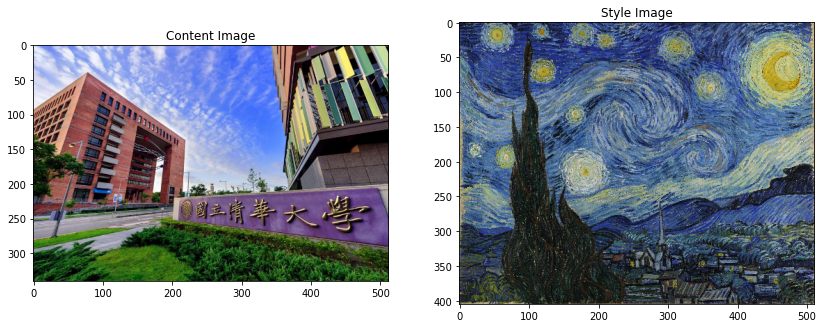

In [6]:
content_path = '/content/gdrive/My Drive/Lab12-2/content_nthu.jpg'
style_path = '/content/gdrive/My Drive/Lab12-2/style_starry_night.jpg'

content_image = load_img(content_path)
style_image = load_img(style_path)

plt.figure(figsize=(14,10))
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

顯示每個 layer 的名稱

In [7]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
    print(layer.name)

80142336/80134624 [==============================] - 1s 0us/step

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [75]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer of interest
style_layers = ['block1_conv1',
          'block2_conv1',
          'block3_conv1', 
          'block4_conv1', 
          'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

content_weight, style_weight, total_variation_weight = 1, 1, 1

### Build the model

In [76]:
def vgg_layers(layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    # Load our model. Load pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

### Extract style and content

In [77]:
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

In [78]:
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg =  vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        "Expects float input in [0,1]"
        inputs = inputs*255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                          outputs[self.num_style_layers:])

        style_outputs = [gram_matrix(style_output)
                         for style_output in style_outputs]

        content_dict = {content_name:value 
                        for content_name, value 
                        in zip(self.content_layers, content_outputs)}

        style_dict = {style_name:value
                      for style_name, value
                      in zip(self.style_layers, style_outputs)}

        return {'content':content_dict, 'style':style_dict}

In [79]:
extractor = StyleContentModel(style_layers, content_layers)

### Define Loss

total variation loss implementation

In [80]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers
    # print("style loss: ", tf.get_static_value(style_loss))

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    # print("content loss", tf.get_static_value(content_loss))
    loss = style_loss + content_loss
    return loss

def total_variation_loss(image):
   value = tf.reduce_sum(tf.abs(image[:,1:,:,:] - image[:,:-1,:,:])) + \
        tf.reduce_sum(tf.abs(image[:,:,1:,:] - image[:,:,:-1,:]))
   value *= total_variation_weight
  #  print("total variation loss:", tf.get_static_value(value))
   return value

### Run gradient descent

In [81]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [82]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']
image = tf.Variable(content_image)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [83]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
        loss += total_variation_weight*total_variation_loss(image)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

In [84]:
import time

def train():
  start = time.time()

  epochs = 10
  steps_per_epoch = 100

  step = 0
  for n in range(epochs):
    for m in range(steps_per_epoch):
      step += 1
      train_step(image)
      
  imshow(image.read_value())
  plt.title("Train step: {}".format(step))
  plt.show()

  end = time.time()
  print("Total time: {:.1f}".format(end-start))

#### Naive weight & Original Layer

```
1. content_weight, style_weight, total_variation_weight = 1, 1, 1
2. content_layers = ['block5_conv2']
3. style_layers = ['block1_conv1',
            'block2_conv1',
            'block3_conv1', 
            'block4_conv1', 
            'block5_conv1']
```



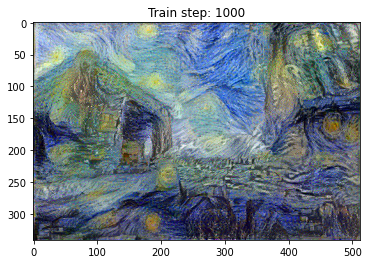

Total time: 62.3


In [19]:
train()

#### Tuned weight & Original layer

```
1. content_weight, style_weight, total_variation_weight = 1, 1e-5, 1e-2
2. content_layers = ['block5_conv2']
3. style_layers = ['block1_conv1',
            'block2_conv1',
            'block3_conv1', 
            'block4_conv1', 
            'block5_conv1']
```

原本若沒有做 weighting，生成的 loss 大小如下所示:

1. style loss:  826962940
2. content loss: 5029
3. total variation loss: 124754

為了讓 loss 能夠有同等的影響力，我把 weighting 設為 1 : 0.00001 : 0.01，讓他們落在同一個數量級上。

調整過後 loss 會變為 5029 : 8269.6 : 1247，訓練結果圖如下所示。

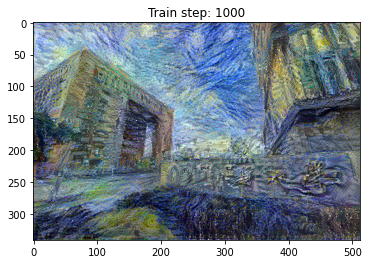

Total time: 63.6


In [25]:
train()

#### Change content layers


```
1. content_weight, style_weight, total_variation_weight = 1, 1, 1
2. content_layers = ['block2_conv1']
3. style_layers = ['block1_conv1',
            'block2_conv1',
            'block3_conv1', 
            'block4_conv1', 
            'block5_conv1']
```



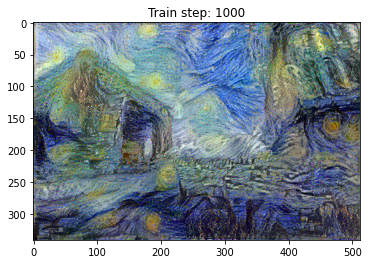

Total time: 63.1


In [74]:
train()

#### Change style layers


```
1. content_weight, style_weight, total_variation_weight = 1, 1, 1
2. content_layers = ['block5_conv2']
3. style_layers = ['block4_conv1', 
          'block5_conv1']
```



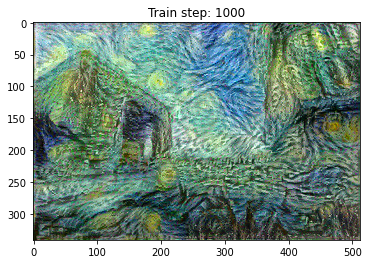

Total time: 57.4


In [85]:
train()

#### Brief report:

1. Weights: 

  根據實驗，style loss的數值遠高於另外兩個loss (content loss & total variation loss)。可以從第一張圖看見，artistic style的成分比較重而原圖細節抹去較多，是因為 style loss domination 使得圖片會更偏向去減少 style loss 而生成藝術感比較重的圖片。
  
  經過 weight 調整後，style loss 的數值比較低了些，可以從第二張圖看出，content image的細節被保留較多。(ex: 大門清華大學字樣)

2. Use different layers:

  為了跟原本使用的 layer 做比較，便固定所有 weights 為 1。

  - replace 'block5_conv2' with 'block2_conv1':
    
    雖然換成使用淺層的 output 去計算 loss，會讓 content loss 變大(原本深層的圖片信息loss -> 淺層的類似pixel loss)，但是 style loss 太大了(domination)，故結果和原本的第一張圖非常相似。

  - discard 'block1_conv1' 'block2_conv1' 'block3_conv1' from style layers:

    把前三個 layers 從 style layer 中丟棄後，可以發現生成圖片的風格變得比較怪異些，高頻的成分變得比較多。猜測是深層 network 的 output 多為圖片的潛在資訊，而淺層 output 則跟圖片的像素有關，把前面幾層淺層輸出拿掉之後，讓 model 變得很難去生成相似的風格。

## AdaIN

In [ ]:
%matplotlib inline

CONTENT_DIRS = ['/content/gdrive/My Drive/mscoco/test2014']
STYLE_DIRS = ['/content/gdrive/My Drive/WikiArt/test']

# VGG19 was trained by Caffe which converted images from RGB to BGR,
# then zero-centered each color channel with respect to the ImageNet 
# dataset, without scaling.  
IMG_MEANS = np.array([103.939, 116.779, 123.68]) # BGR

IMG_SHAPE = (224, 224, 3) # training image shape, (h, w, c)
SHUFFLE_BUFFER = 1000
BATCH_SIZE = 32
EPOCHS = 30
STEPS_PER_EPOCH = 12000 // BATCH_SIZE

In [ ]:
def sample_files(dir, num, pattern='**/*.jpg'):
    '''Samples files in a directory using the reservoir sampling.'''

    paths = Path(dir).glob(pattern) # list of Path objects
    sampled = []
    for i, path in enumerate(paths):
        if i < num:
            sampled.append(path) 
        else:
            s = random.randint(0, i)
            if s < num:
                sampled[s] = path
    return sampled

def plot_images(dir, row, col, pattern):
    paths = sample_files(dir, row*col, pattern)

    plt.figure(figsize=(2*col, 2*row))
    for i in range(row*col):
        im = Image.open(paths[i])
        w, h = im.size

        plt.subplot(row, col, i+1)
        plt.imshow(im)
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        plt.xlabel(f'{w}x{h}')
    plt.show()

In [ ]:
def clean(dir_path, min_shape=None):
    paths = Path(dir_path).glob('**/*.jpg')
    deleted  = 0
    for path in paths:
        try:
            # Make sure we can decode the image
            im = tf.io.read_file(str(path.resolve()))
            im = tf.image.decode_jpeg(im)

            # Remove grayscale images 
            shape = im.shape
            if shape[2] < 3:
                path.unlink()
                deleted += 1

            # Remove small images
            if min_shape is not None:
                if shape[0] < min_shape[0] or shape[1] < min_shape[1]:
                    path.unlink()
                    deleted += 1
        except Exception as e:
            path.unlink()
            deleted += 1
    return deleted

for dir in CONTENT_DIRS:
    deleted = clean(dir)
print(f'#Deleted content images: {deleted}')

for dir in STYLE_DIRS:
    deleted = clean(dir)
print(f'#Deleted style images: {deleted}')

In [ ]:
def preprocess_image(path, init_shape=(448, 448)):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, init_shape)
    image = tf.image.random_crop(image, size=IMG_SHAPE)
    image = tf.cast(image, tf.float32)
    
    # Convert image from RGB to BGR, then zero-center each color channel with
    # respect to the ImageNet dataset, without scaling.
    image = image[..., ::-1] # RGB to BGR
    image -= (103.939, 116.779, 123.68) # BGR means
    return image

def np_image(image):
    image += (103.939, 116.779, 123.68) # BGR means
    image = image[..., ::-1] # BGR to RGB
    image = tf.clip_by_value(image, 0, 255)
    image = tf.cast(image, dtype='uint8')
    return image.numpy()

def build_dataset(num_gpus=1):
    c_paths = []
    for c_dir in CONTENT_DIRS:
        c_paths += Path(c_dir).glob('*.jpg')
    c_paths = [str(path.resolve()) for path in c_paths]
    s_paths = []
    for s_dir in STYLE_DIRS:
        s_paths += Path(s_dir).glob('*.jpg')
    s_paths = [str(path.resolve()) for path in s_paths]
    print(f'Building dataset from {len(c_paths):,} content images and {len(s_paths):,} style images... ', end='')

    AUTOTUNE = tf.data.experimental.AUTOTUNE

    c_ds = tf.data.Dataset.from_tensor_slices(c_paths)
    c_ds = c_ds.map(preprocess_image, num_parallel_calls=AUTOTUNE)
    c_ds = c_ds.repeat()
    c_ds = c_ds.shuffle(buffer_size=SHUFFLE_BUFFER)

    s_ds = tf.data.Dataset.from_tensor_slices(s_paths)
    s_ds = s_ds.map(preprocess_image, num_parallel_calls=AUTOTUNE)
    s_ds = s_ds.repeat()
    s_ds = s_ds.shuffle(buffer_size=SHUFFLE_BUFFER)

    ds = tf.data.Dataset.zip((c_ds, s_ds))
    ds = ds.batch(BATCH_SIZE * num_gpus)
    ds = ds.prefetch(buffer_size=AUTOTUNE)

    print('done')
    return ds

In [ ]:
ds = build_dataset()
c_batch, s_batch = next(iter(ds.take(1)))

print('Content batch shape:', c_batch.shape)
print('Style batch shape:', s_batch.shape)

plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(np_image(c_batch[0]))
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('Content')

plt.subplot(1, 2, 2)
plt.imshow(np_image(s_batch[0]))
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('Style')

plt.show()

### Adaptive Instance Normalization


AdaIN implementation is HERE!

1. 利用 tf.nn.moments 去計算 content & style feature 的 mean & variance
2. 將 variance 取平方根後得到 standard deviation (加上 epsilon 避免 numerical errors)
3. 根據公式把 content feature 標準化後，再乘上 style 的標準差並加上平均值

In [ ]:
class AdaIN(tf.keras.layers.Layer):
  def __init__(self, name='adain', eps=1e-5):
    super(AdaIN, self).__init__(name=name)
    self.epsilon = eps

  def call(self, feature):
    (content, style) = feature
    content_mean, content_var = tf.nn.moments(content, axes=[1,2], keepdims=True)
    style_mean, style_var = tf.nn.moments(style, axes=[1,2], keepdims=True)

    content_std = tf.sqrt(content_var + self.epsilon)
    style_std = tf.sqrt(style_var + self.epsilon)

    return (content - content_mean) / content_std * style_std + style_mean

In [ ]:
class ArbitraryStyleTransferNet(tf.keras.Model):
    CONTENT_LAYER = 'block4_conv1'
    STYLE_LAYERS = ('block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1')

    @staticmethod
    def declare_decoder():
        a_input = tf.keras.Input(shape=(28, 28, 512), name='input_adain')

        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(a_input)
        h = tf.keras.layers.UpSampling2D(2)(h)
        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(256, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(128, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.UpSampling2D(2)(h)
        h = tf.keras.layers.Conv2DTranspose(128, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.Conv2DTranspose(64, 3, padding='same', activation='relu')(h)
        h = tf.keras.layers.UpSampling2D(2)(h)
        h = tf.keras.layers.Conv2DTranspose(64, 3, padding='same', activation='relu')(h)
        output = tf.keras.layers.Conv2DTranspose(3, 3, padding='same')(h)

        return tf.keras.Model(inputs=a_input, outputs=output, name='decoder')
  
    def __init__(self,
                 img_shape=(224, 224, 3),
                 content_loss_weight=1,
                 style_loss_weight=10,
                 name='arbitrary_style_transfer_net',
                 **kwargs):
        super(ArbitraryStyleTransferNet, self).__init__(name=name, **kwargs)

        self.img_shape = img_shape
        self.content_loss_weight = content_loss_weight
        self.style_loss_weight = style_loss_weight
        
        vgg19 = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_shape=img_shape)
        vgg19.trainable = False

        c_output = [vgg19.get_layer(ArbitraryStyleTransferNet.CONTENT_LAYER).output]
        s_outputs = [vgg19.get_layer(name).output for name in ArbitraryStyleTransferNet.STYLE_LAYERS]
        self.vgg19 = tf.keras.Model(inputs=vgg19.input, outputs=c_output+s_outputs, name='vgg19')
        self.vgg19.trainable = False

        self.adain = AdaIN(name='adain')
        self.decoder = ArbitraryStyleTransferNet.declare_decoder()
  
    def call(self, inputs):
        c_batch, s_batch = inputs

        c_enc = self.vgg19(c_batch)
        c_enc_c = c_enc[0]

        s_enc = self.vgg19(s_batch)
        s_enc_c = s_enc[0]
        s_enc_s = s_enc[1:] 
        
        # normalized_c is the output of AdaIN layer
        normalized_c = self.adain((c_enc_c, s_enc_c))
        output = self.decoder(normalized_c)

        # Calculate loss
        out_enc = self.vgg19(output)
        out_enc_c = out_enc[0]
        out_enc_s = out_enc[1:]

        loss_c = tf.reduce_mean(tf.math.squared_difference(out_enc_c, normalized_c))
        self.add_loss(self.content_loss_weight * loss_c)
        
        loss_s = 0
        for o, s in zip(out_enc_s, s_enc_s):    
            o_mean, o_var = tf.nn.moments(o, axes=(1,2), keepdims=True)
            o_std = tf.sqrt(o_var + self.adain.epsilon)

            s_mean, s_var = tf.nn.moments(s, axes=(1,2), keepdims=True)
            s_std = tf.sqrt(s_var + self.adain.epsilon)

            loss_mean = tf.reduce_mean(tf.math.squared_difference(o_mean, s_mean))
            loss_std = tf.reduce_mean(tf.math.squared_difference(o_std, s_std))

            loss_s += loss_mean + loss_std
        self.add_loss(self.style_loss_weight * loss_s)

        return output, c_enc_c, normalized_c, out_enc_c

In [ ]:
def plot_outputs(outputs, captions=None, col=5):
    row = len(outputs)
    plt.figure(figsize=(3*col, 3*row))
    for i in range(col):
        for j in range(row):
            plt.subplot(row, col, j*col+i+1)
            plt.imshow(np_image(outputs[j][i,...,:3]))
            plt.grid(False)
            plt.xticks([])
            plt.yticks([])
            if captions is not None:
                plt.xlabel(captions[j])
    plt.show()

In [ ]:
ds = build_dataset()
model = ArbitraryStyleTransferNet(img_shape=IMG_SHAPE)

c_batch, s_batch = next(iter(ds.take(1)))
print(f'Input shape: ({c_batch.shape}, {s_batch.shape})')
output, *_ = model((c_batch, s_batch))
print(f'Output shape: {output.shape}')
print(f'Init. content loss: {model.losses[0]:,.2f}, style loss: {model.losses[1]:,.2f}')
model.summary()

Building dataset from 40,649 content images and 23,555 style images... done
80142336/80134624 [==============================] - 1s 0us/step
Input shape: ((32, 224, 224, 3), (32, 224, 224, 3))
Output shape: (32, 224, 224, 3)
Init. content loss: 3,403,019.75, style loss: 26,381,778.00
Model: "arbitrary_style_transfer_net"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           [(None, 28, 28, 512), (No 3505728   
_________________________________________________________________
adain (AdaIN)                multiple                  0         
_________________________________________________________________
decoder (Functional)         (None, 224, 224, 3)       3505219   
Total params: 7,010,947
Trainable params: 3,505,219
Non-trainable params: 3,505,728
_________________________________________________________________


### Training

In [ ]:
# Train the model
optimizer = tf.keras.optimizers.Adam(lr=5e-4)
c_loss_metric, s_loss_metric = tf.keras.metrics.Mean(), tf.keras.metrics.Mean()

CKP_DIR = '/content/gdrive/My Drive/Lab12-2/checkpoints'
init_epoch = 1

ckp = tf.train.latest_checkpoint(CKP_DIR)
if ckp:
    model.load_weights(ckp)
    init_epoch = int(ckp.split('_')[-1]) + 1
    print(f'Resume training from epoch {init_epoch-1}')

Resume training from epoch 28


In [ ]:
@tf.function
def train_step(inputs):
    with tf.GradientTape() as tape:
        model(inputs)
        c_loss, s_loss = model.losses
        loss = c_loss + s_loss
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

    c_loss_metric(c_loss)
    s_loss_metric(s_loss)

In [ ]:
def train(dataset, init_epoch):
    for epoch in range(init_epoch, EPOCHS+1):
        print(f'Epoch {epoch:>2}/{EPOCHS}')
        for step, inputs in enumerate(ds.take(STEPS_PER_EPOCH)):
            train_step(inputs)
            print(f'{step+1:>5}/{STEPS_PER_EPOCH} - loss: {c_loss_metric.result()+s_loss_metric.result():,.2f} - content loss: {c_loss_metric.result():,.2f} - style loss: {s_loss_metric.result():,.2f}', end='\r') 

        print()
        model.save_weights(os.path.join(CKP_DIR, f'ckpt_{epoch}'))
        c_loss_metric.reset_states()
        s_loss_metric.reset_states()

        output, c_enc_c, normalized_c, out_enc_c = model((c_batch, s_batch))
        plot_outputs((s_batch, c_batch, output, c_enc_c, normalized_c, out_enc_c), 
                     ('Style', 'Content', 'Trans', 'Content Enc', 'Normalized', 'Trans Enc'))

Epoch 16/30



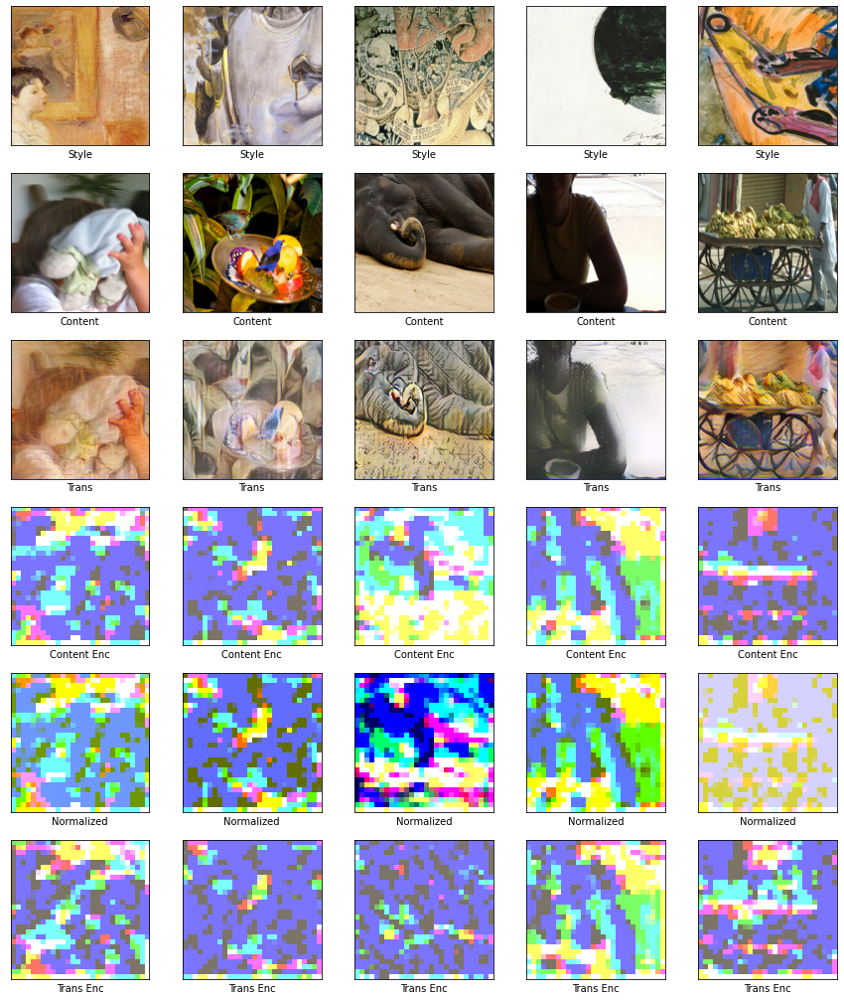

Epoch 17/30



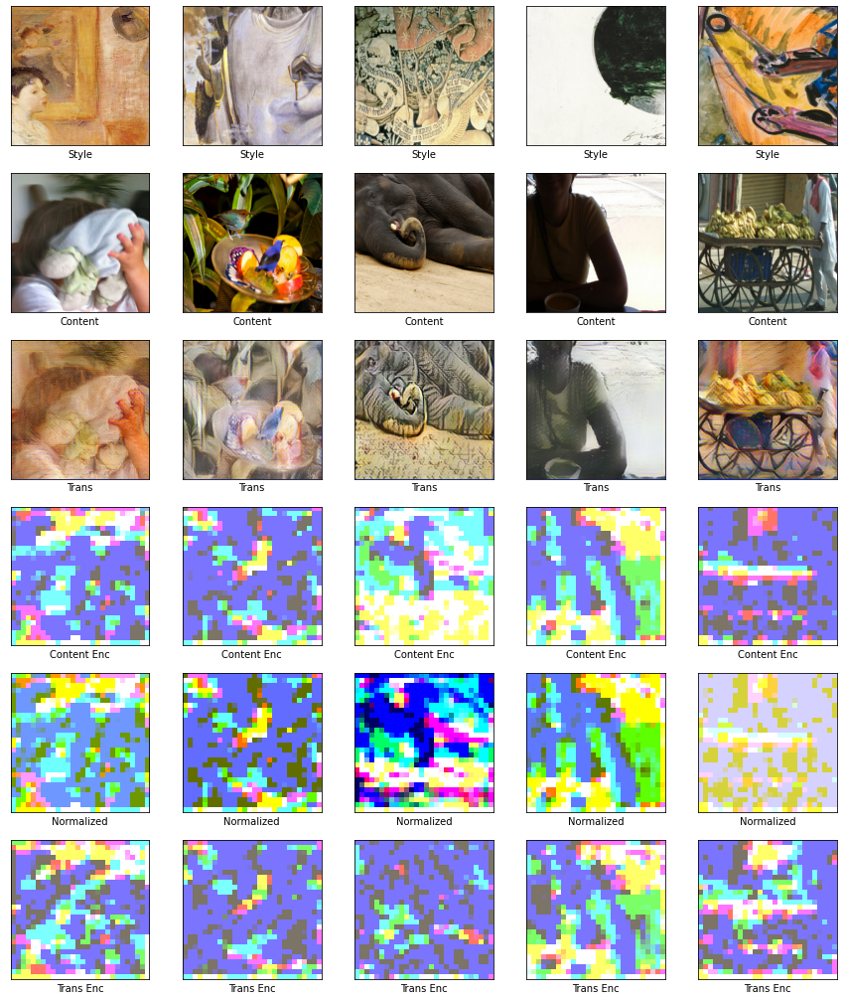

Epoch 18/30



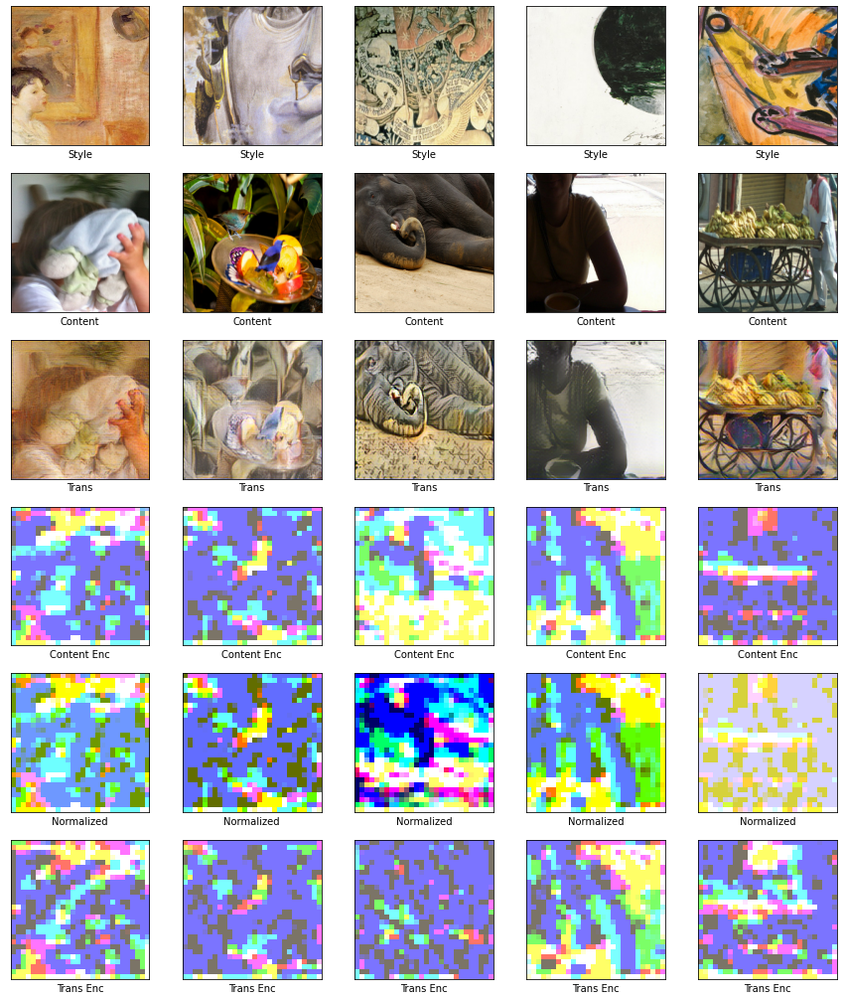

Epoch 19/30



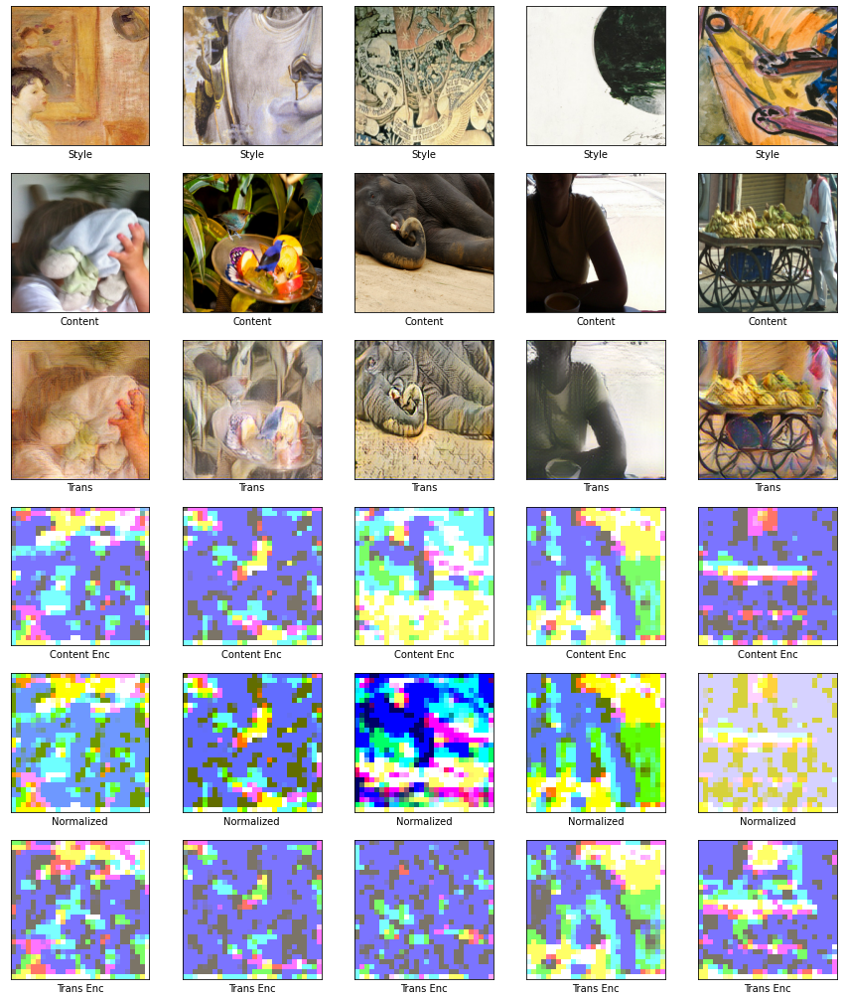

Epoch 20/30



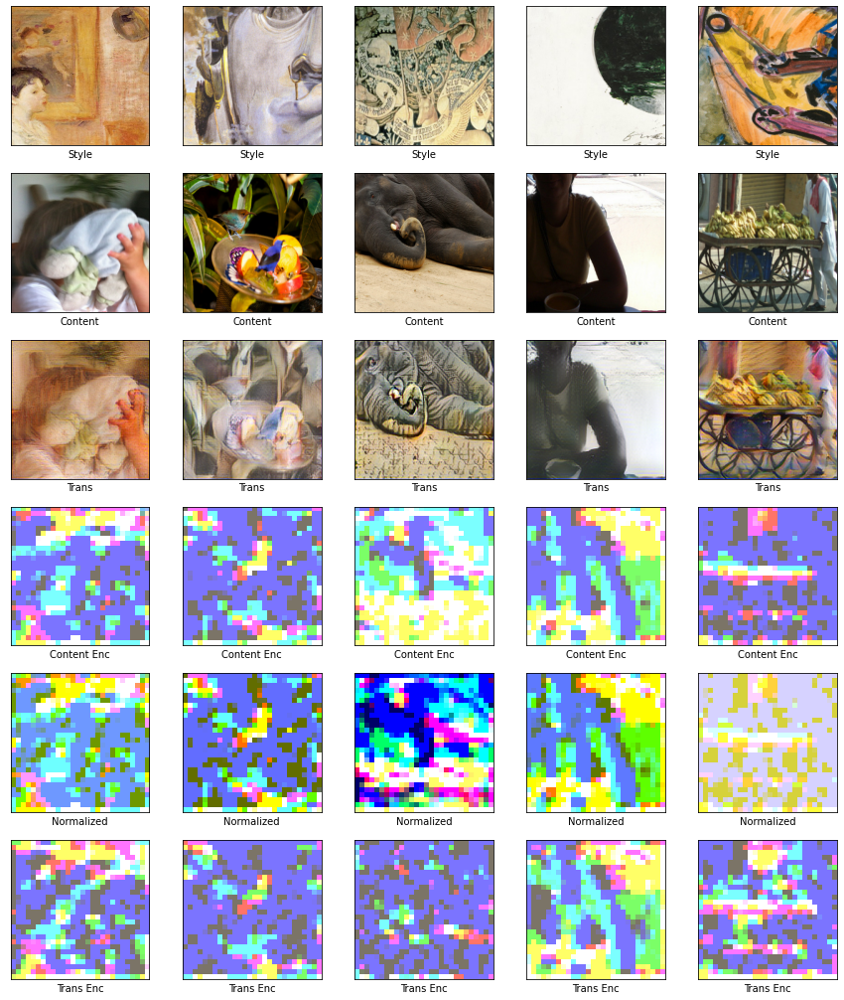

Epoch 21/30



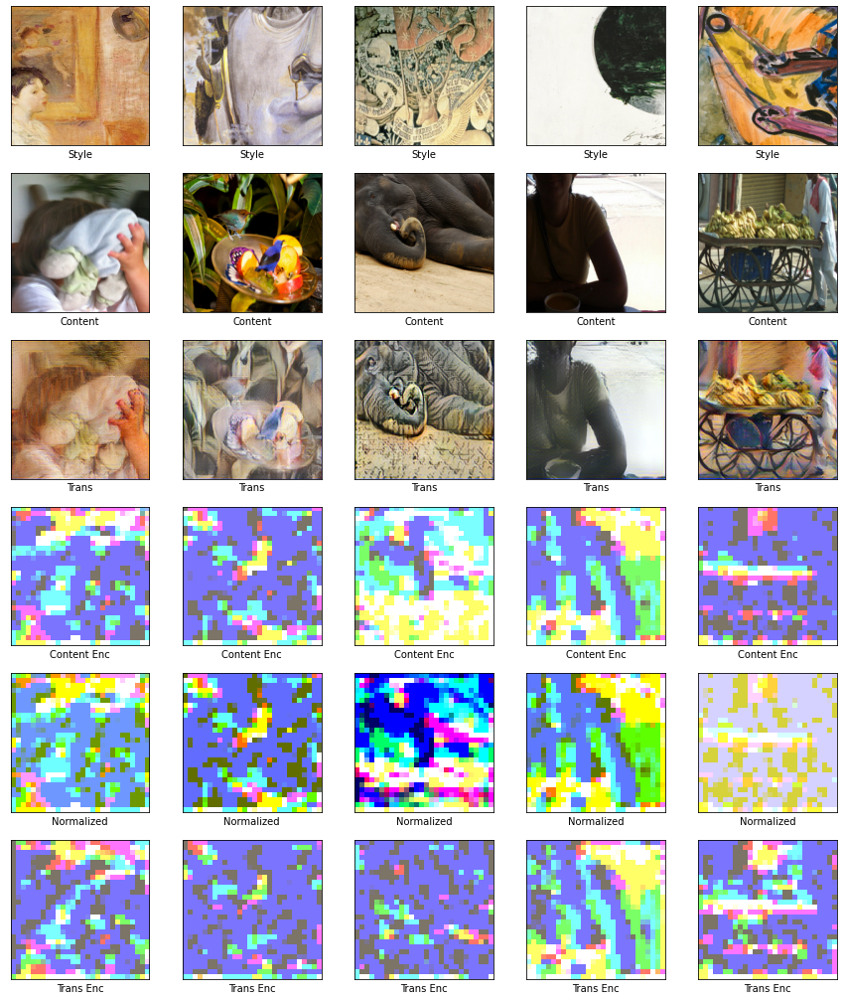

Epoch 22/30



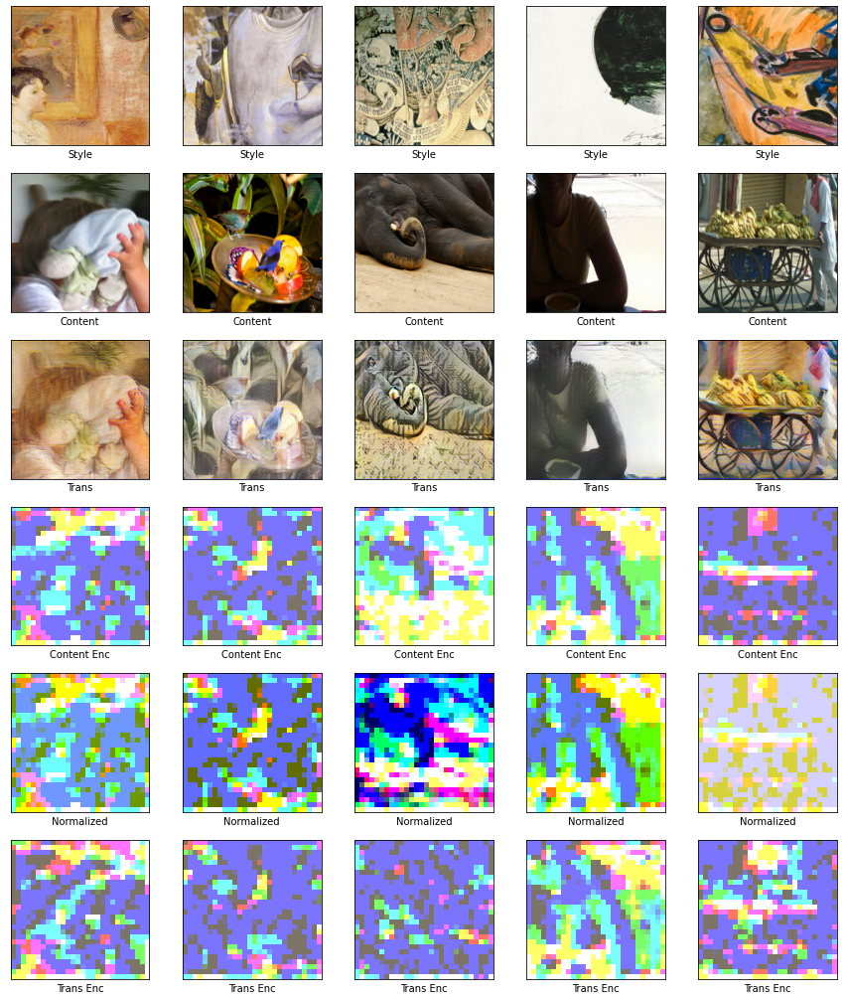

Epoch 23/30



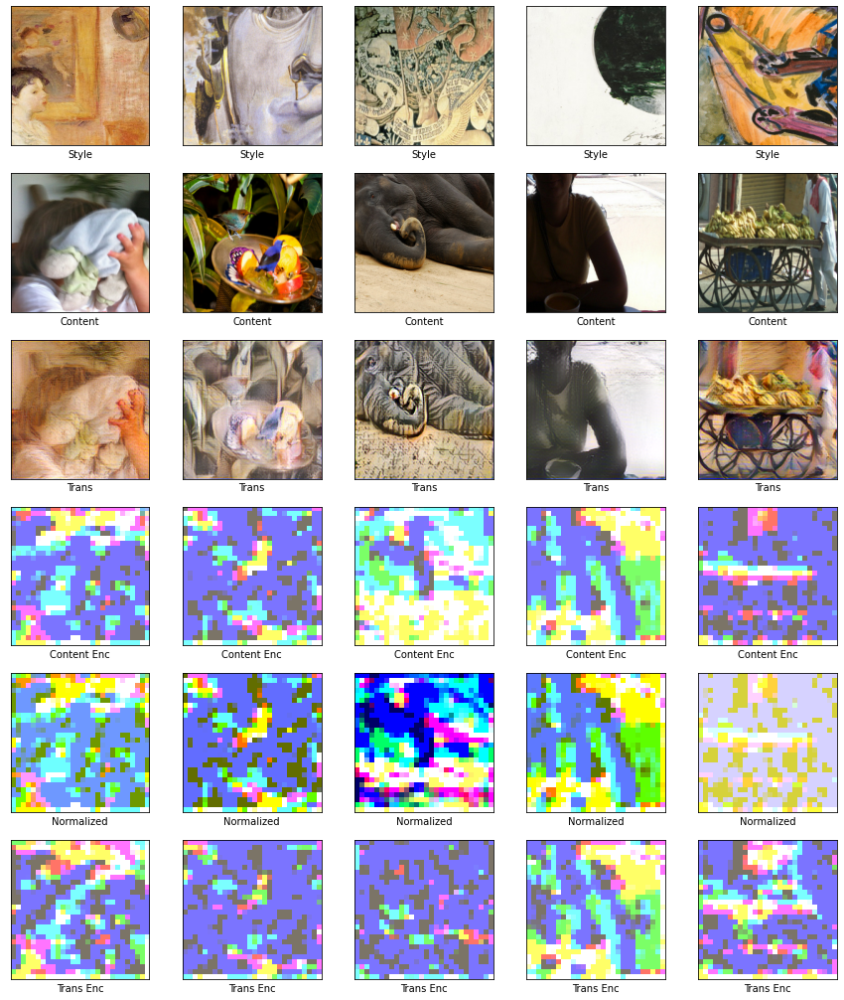

Epoch 24/30



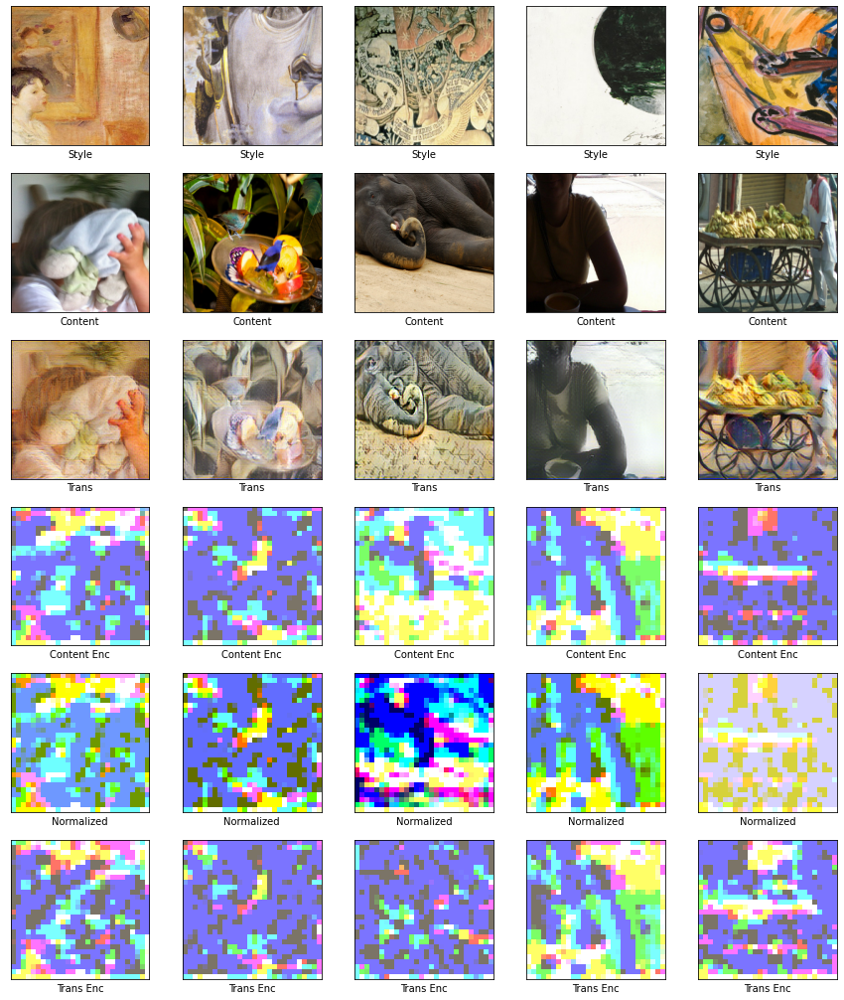

Epoch 25/30



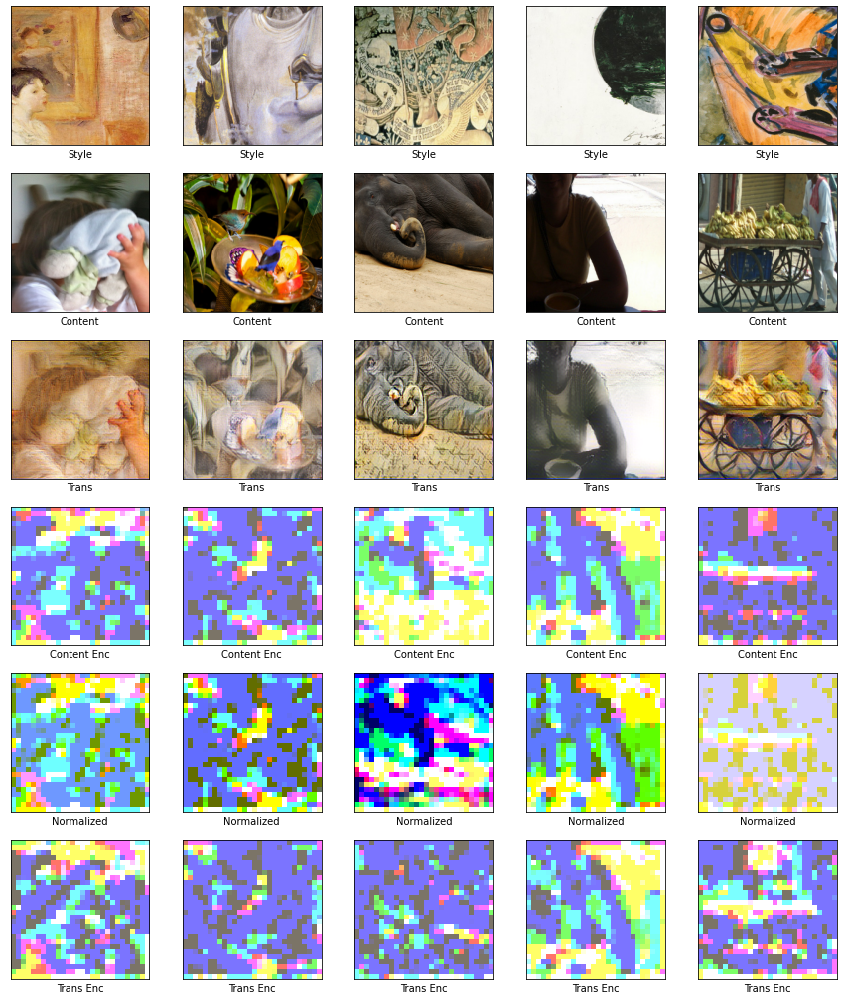

Epoch 26/30



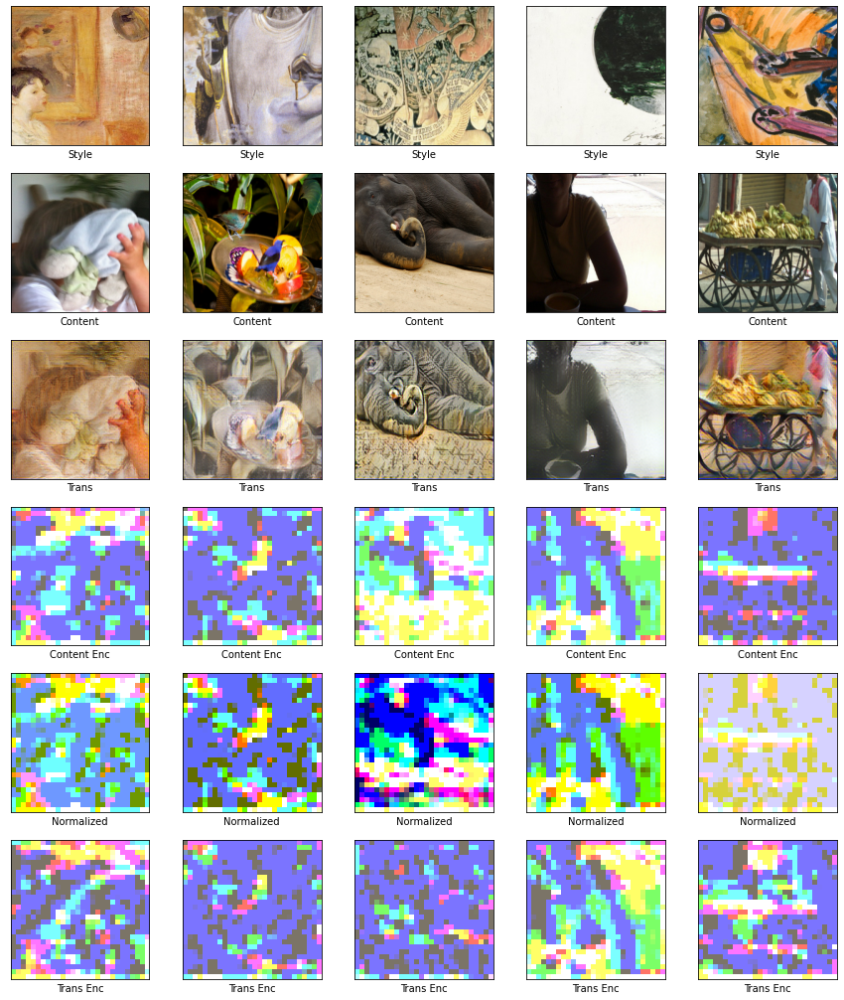

Epoch 27/30



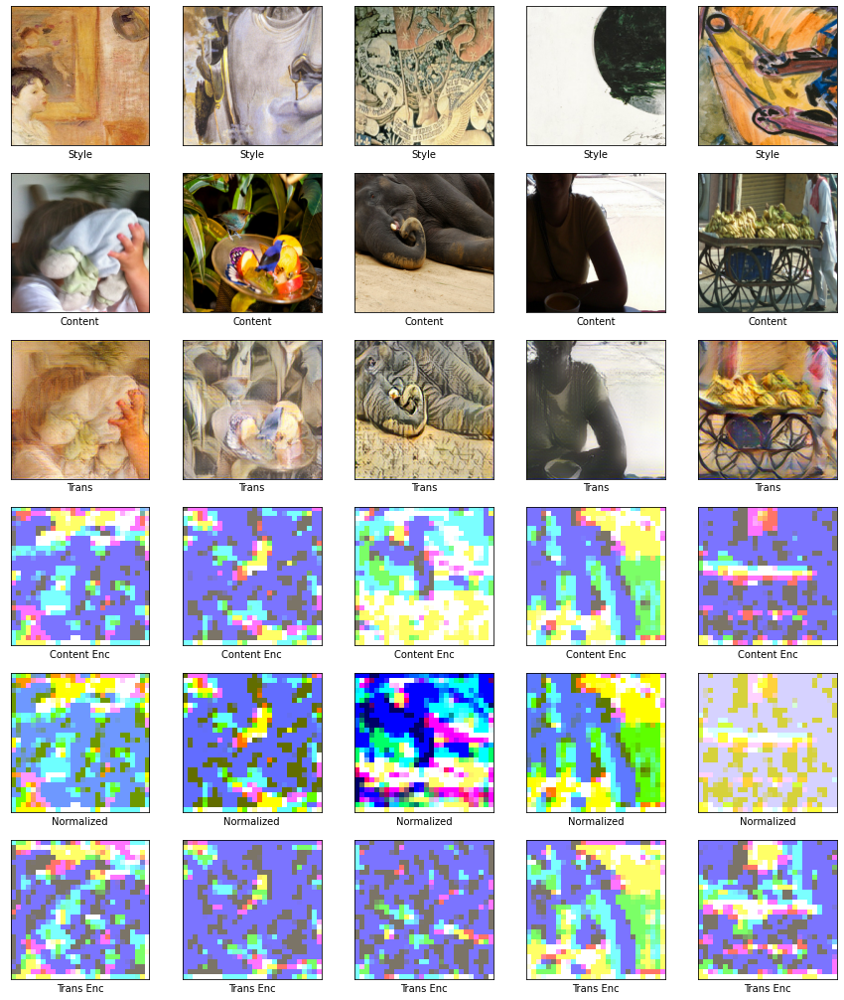

Epoch 28/30



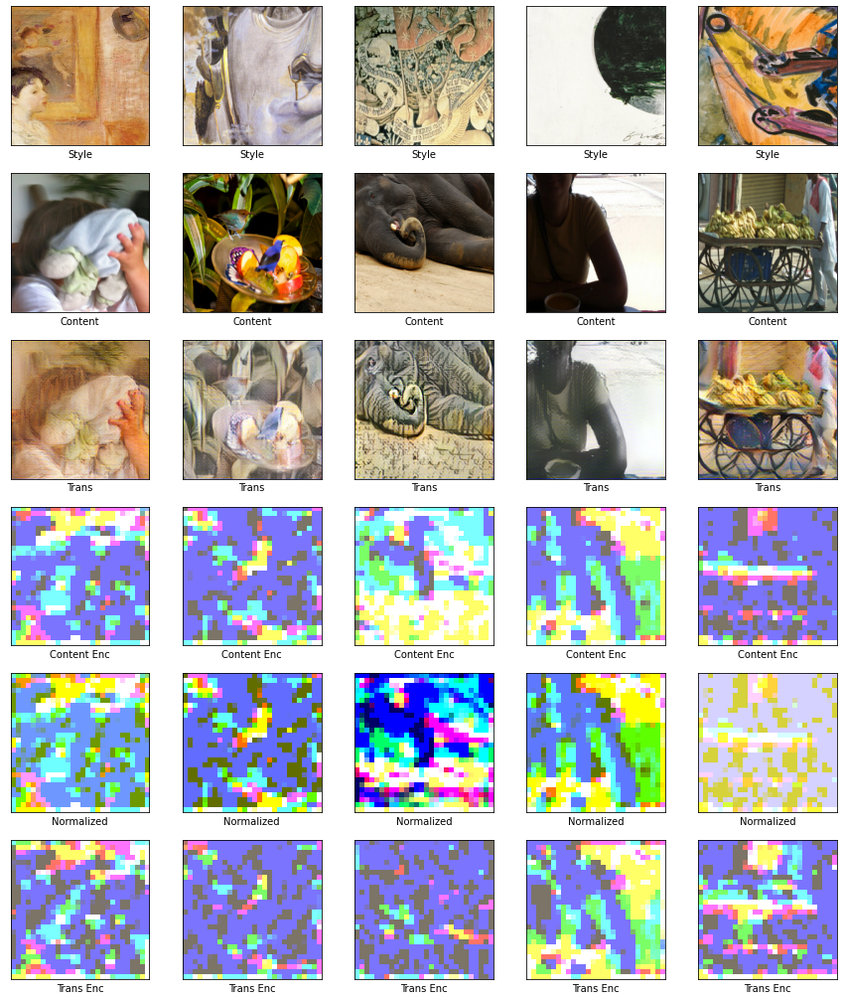

Epoch 29/30


In [ ]:
train(ds, init_epoch)

### Testing Output

In [ ]:
CKP_DIR = '/content/gdrive/My Drive/Lab12-2/checkpoints'
ckp = tf.train.latest_checkpoint(CKP_DIR)
model = ArbitraryStyleTransferNet(img_shape=IMG_SHAPE)
model.load_weights(ckp)

Recovered loss: 625930.75


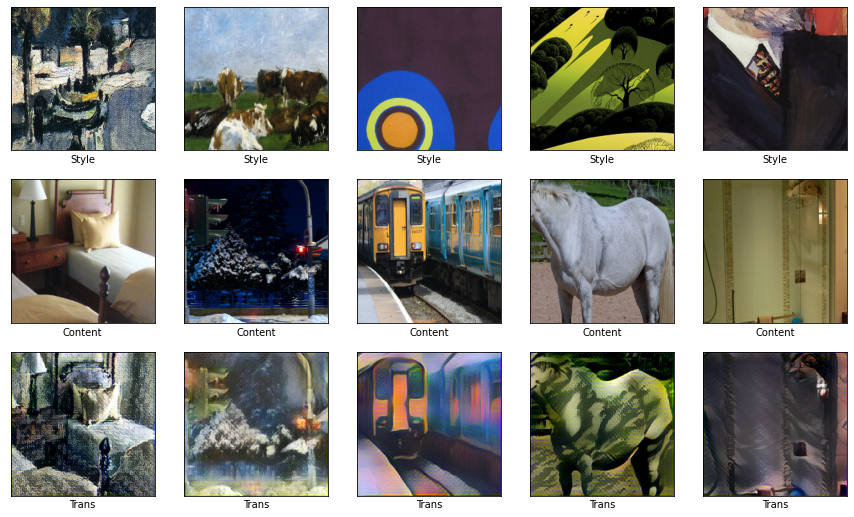

Recovered loss: 622070.56


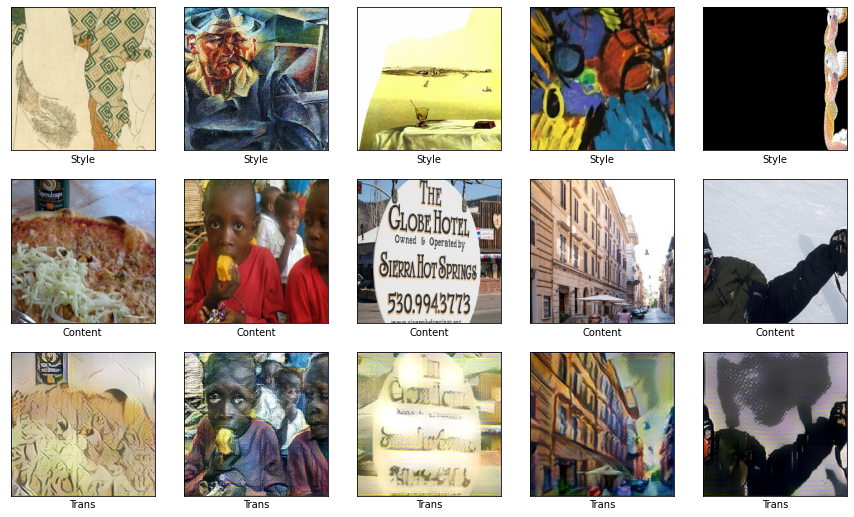

In [ ]:
for idx, (c_batch, s_batch) in enumerate(ds):
    if idx > 1:
        break
    output, c_enc_c, normalized_c, out_enc_c = model((c_batch, s_batch))
    print('Recovered loss:', tf.reduce_sum(model.losses).numpy())

    plot_outputs((s_batch, c_batch, output), ('Style', 'Content', 'Trans'))

In [ ]:
def preprocess_example(path, init_shape=(IMG_SHAPE[0], IMG_SHAPE[1])):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, init_shape)
    image = tf.cast(image, tf.float32)
    
    # Convert image from RGB to BGR, then zero-center each color channel with
    # respect to the ImageNet dataset, without scaling.
    image = image[..., ::-1] # RGB to BGR
    image -= (103.939, 116.779, 123.68) # BGR means
    return image

def nthu_example(num_gpus=1):
    c_paths = ['/content/gdrive/My Drive/Lab12-2/content_nthu.jpg']
    
    s_paths = []
    for s_dir in STYLE_DIRS:
        s_paths += Path(s_dir).glob('*.jpg')
    s_paths = [str(path.resolve()) for path in s_paths]
    print(f'Building dataset from {len(c_paths):,} content images and {len(s_paths):,} style images... ', end='')
    
    AUTOTUNE = tf.data.experimental.AUTOTUNE
    
    c_ds = tf.data.Dataset.from_tensor_slices(c_paths)
    c_ds = c_ds.map(preprocess_example, num_parallel_calls=AUTOTUNE)
    c_ds = c_ds.repeat()
    c_ds = c_ds.shuffle(buffer_size=SHUFFLE_BUFFER)
    
    s_ds = tf.data.Dataset.from_tensor_slices(s_paths)
    s_ds = s_ds.map(preprocess_image, num_parallel_calls=AUTOTUNE)
    s_ds = s_ds.repeat()
    s_ds = s_ds.shuffle(buffer_size=SHUFFLE_BUFFER)
    
    ds = tf.data.Dataset.zip((c_ds, s_ds))
    ds = ds.batch(BATCH_SIZE * num_gpus)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    
    print('done')
    return ds

Building dataset from 1 content images and 23,555 style images... done


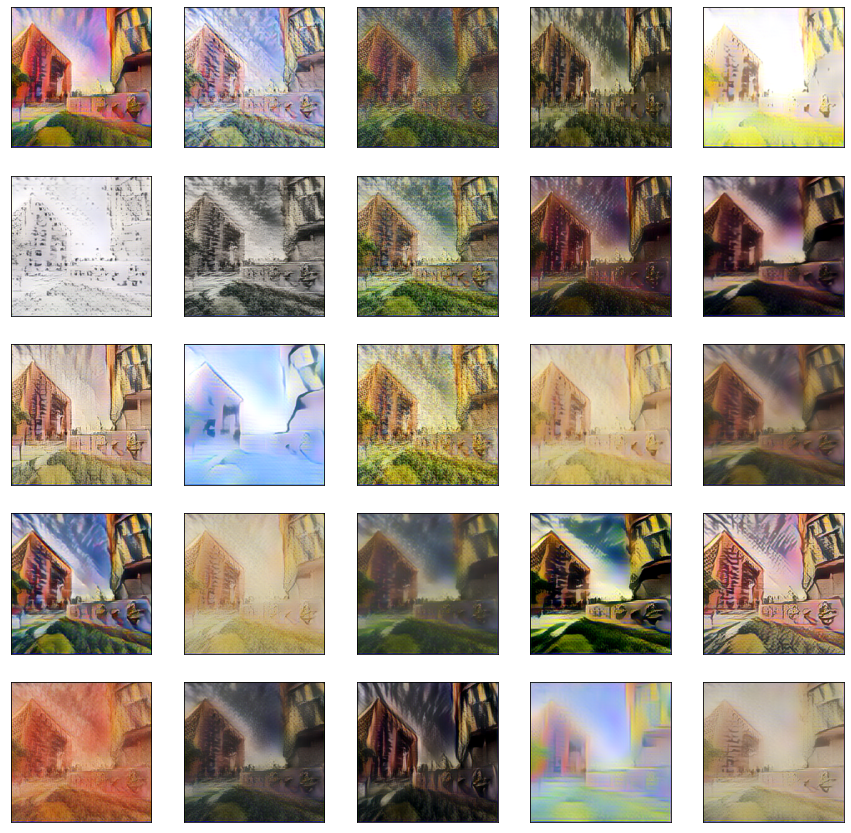

In [ ]:
ds = nthu_example()
outputs = []

for idx, (c_batch, s_batch) in enumerate(ds):
    if idx > 4:
        break
    output, c_enc_c, normalized_c, out_enc_c = model((c_batch, s_batch))
    outputs.append(output)
    
plot_outputs((outputs))

從上方 NTHU Example 可以明顯看出多個 style image 應用在 nthu.jpg 上面的效果!